# Import necessary libraries


In [1]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import GlobalAveragePooling2D
from keras.applications import VGG16, MobileNetV2
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import pickle
import random

ModuleNotFoundError: No module named 'numpy'

# Using dataset with 8 categories:

In [ ]:
# ======================================================
# 1. DATASET
# ======================================================
# Using natural_images dataset with 8 categories:
# airplane, car, cat, dog, flower, fruit, motorbike, person


DATADIR = r''
CATEGORIES = ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
IMG_SIZE = 150  # Increased image size for better feature extraction




# 2. Data Analysis


## 2.1 Dataset Analysis Function Definition


In [ ]:
## 2.1 Dataset Analysis Function Definition

# Function to analyze dataset distribution and characteristics
def analyze_dataset():
    class_counts = []
    img_dimensions = []
    total_size = 0
    
    print("Analyzing dataset...")
    for category in CATEGORIES:
        path = os.path.join(DATADIR, category)
        class_size = len(os.listdir(path))
        class_counts.append(class_size)
        total_size = class_size + total_size
        
        # Sample a few images to check dimensions
        for img_name in list(os.listdir(path))[:5]:
            img_path = os.path.join(path, img_name)
            img = cv2.imread(img_path)
            if img is not None:
                img_dimensions.append(img.shape)
                
        print(f"Class {category}: {class_size} images")
    
    print(f"\n\n\n\n total images count is {total_size}")
    
    # Visualize class distribution
    # Creates a bar chart showing how many images are in each class
    plt.figure(figsize=(10, 6))
    plt.bar(CATEGORIES, class_counts)
    plt.title('Class Distribution in Dataset')
    plt.xlabel('Categories')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Display sample images from each class
    plt.figure(figsize=(15, 10))
    for i, category in enumerate(CATEGORIES):
        path = os.path.join(DATADIR, category)
        sample_img_path = os.path.join(path, os.listdir(path)[0])
        img = cv2.imread(sample_img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        
        plt.subplot(2, 4, i+1)
        plt.imshow(img)
        plt.title(category)
        plt.axis('off')
    
    plt.suptitle('Sample Images from Each Class')
    plt.tight_layout()
    plt.show()
    
    # Analyze image dimensions
    print("\nImage dimension analysis:")
    unique_dims = set(str(dim) for dim in img_dimensions)
    for dim in unique_dims:
        count = list(map(str, img_dimensions)).count(dim)
        print(f"Dimension {dim}: {count} images")


## 2.2 Run Dataset Analysis


Analyzing dataset...
Class airplane: 727 images
Class car: 968 images
Class cat: 885 images
Class dog: 702 images
Class flower: 843 images
Class fruit: 1000 images
Class motorbike: 788 images
Class person: 986 images




 total images count is 6899


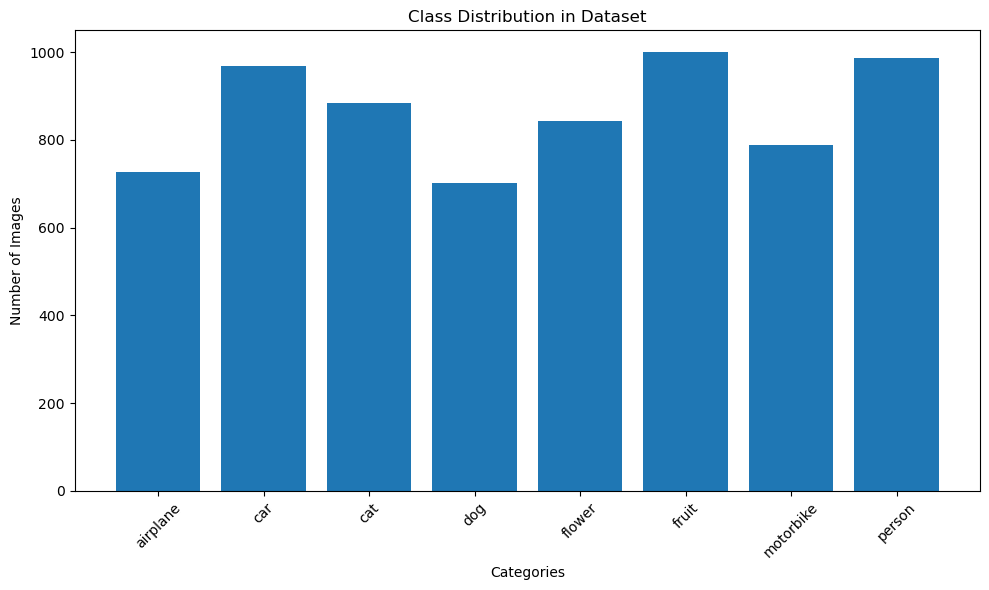

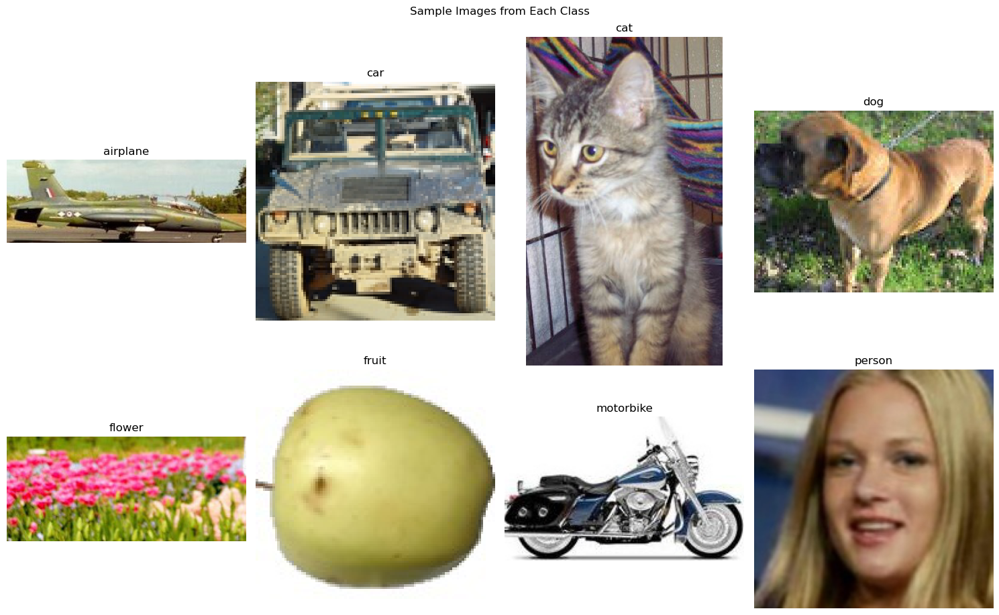


Image dimension analysis:
Dimension (215, 337, 3): 1 images
Dimension (117, 194, 3): 1 images
Dimension (188, 190, 3): 1 images
Dimension (94, 290, 3): 1 images
Dimension (129, 198, 3): 1 images
Dimension (101, 303, 3): 1 images
Dimension (201, 90, 3): 1 images
Dimension (114, 112, 3): 1 images
Dimension (100, 100, 3): 10 images
Dimension (396, 236, 3): 1 images
Dimension (98, 305, 3): 1 images
Dimension (92, 210, 3): 1 images
Dimension (305, 498, 3): 1 images
Dimension (113, 286, 3): 1 images
Dimension (256, 171, 3): 1 images
Dimension (121, 191, 3): 1 images
Dimension (104, 179, 3): 1 images
Dimension (475, 249, 3): 1 images
Dimension (89, 117, 3): 1 images
Dimension (235, 392, 3): 1 images
Dimension (219, 452, 3): 1 images
Dimension (475, 283, 3): 1 images
Dimension (242, 438, 3): 1 images
Dimension (109, 191, 3): 1 images
Dimension (104, 300, 3): 1 images
Dimension (385, 478, 3): 1 images
Dimension (256, 256, 3): 5 images


In [ ]:
# Run data analysis
analyze_dataset()


# 3. Preprocessing


## 3.1 Function to Preprocess and Load Training Data


In [ ]:

# Function to create and preprocess training data
def create_training_data():
    training_data = [] # Creates an empty list to store processed images and their labels.
    
    print("Processing images...")
    for category in CATEGORIES:
        path = os.path.join(DATADIR, category) #Creates the full path to the folder containing images of this category.
        class_num = CATEGORIES.index(category) #Converts the category name to a number (e.g., "cat" might become 2).
        
        for img_name in tqdm(os.listdir(path)):
            try:
                img_path = os.path.join(path, img_name)
                # Load as RGB instead of grayscale
                img_array = cv2.imread(img_path) # Loads the image into memory as a numpy array
                img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)#Converts the image from BGR format to RGB format
                
                if img_array is not None:
                    # Resize image
                    resized_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE)) #Resizes the image to 150×150 pixels.
                    # Normalize pixel values to range [0,1]
                    resized_array = resized_array / 255.0 #Normalizes pixel values from 0-255 to 0-1 range.
                    # Smaller values help prevent numerical instability during training
                    # Neural networks generally perform better with normalized data
                    
                    training_data.append([resized_array, class_num]) #Adds the processed image and its label to the training data list.
            except Exception as e:
                print(f"Error processing {img_name}: {e}")
    
    # Shuffle data
    random.shuffle(training_data)
    # Shuffling prevents the model from learning patterns based on the order of data
    return training_data


## 3.2 Create Dataset Arrays from Processed Data


In [ ]:

# Generate processed training data
training_data = create_training_data() #Calls the function and stores the result.
print(f"Total processed images: {len(training_data)}")

# Separate features and labels
X = []  # Images, Creates an empty list for images.
y = []  # Labels, Creates an empty list for labels.

for features, label in training_data: #Loops through each image-label pair.
    X.append(features) # Adds the image to the X list.
    y.append(label) # Adds the label to the y list.

# Converts the lists to NumPy arrays for more efficient processing
X = np.array(X) # Converts the list of images to a numpy array
y = np.array(y) # Converts the list of labels to a numpy array.

print(f"Data shape: {X.shape}")
print(f"Labels shape: {y.shape}")


Processing images...


100%|██████████| 986/986 [00:11<00:00, 89.63it/s] 


Total processed images: 6899
Data shape: (6899, 150, 150, 3)
Labels shape: (6899,)


## 3.3 Save Preprocessed Data as Pickle Files


In [7]:

# Save processed data
pickle_out = open("X.pickle", "wb") # Opens a file to save the image data
pickle.dump(X, pickle_out) # Saves the image data to the file.
pickle_out.close()

pickle_out = open("y.pickle", "wb") # Opens a file to save the label data.
pickle.dump(y, pickle_out) # Saves the label data to the file.
pickle_out.close()


# 4. Data Splitting and Augmentation


## 4.1 Split Dataset into Train, Validation, and Test Sets


In [ ]:

# Split into train, validation, and test sets (70%, 15%, 15%)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

# First split: separates data into 85% training+validation and 15% test data
# X contains all images, y contains all labels
# test_size=0.15 means 15% goes to test set
# random_state=42 ensures you get the same split each time you run the code

X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.15/0.85, random_state=42)

# Second split: divides the 85% portion into training and validation
# test_size=0.15/0.85 ≈ 0.176 means about 17.6% of the 85% goes to validation
# This gives the final 70%-15%-15% split for training-validation-test

print(f"Training set: {X_train.shape[0]} images")
print(f"Validation set: {X_val.shape[0]} images")
print(f"Test set: {X_test.shape[0]} images")


Training set: 4829 images
Validation set: 1035 images
Test set: 1035 images


## 4.2 Define Data Augmentation Strategy


In [9]:

# Data augmentation for training set
# Creates a data generator that will produce modified versions of training images.
train_datagen = ImageDataGenerator(
    rotation_range=15, # Randomly rotates images up to 15 degrees.
    width_shift_range=0.1, # Randomly shifts images horizontally by up to 10% of total width.
    height_shift_range=0.1, # Randomly shifts images vertically by up to 10% of total height.
    shear_range=0.1, # Applies random shear transformations (slanting) up to 10%.
    zoom_range=0.1, # Randomly zooms in or out of images by up to 10%.
    horizontal_flip=True, # Randomly flips images horizontally.
    fill_mode='nearest' # Determines how to fill in new pixels created after transformations.
)


## 4.3 Visualize Data Augmentation Examples


In [10]:

# Visualization of augmented images
# Defines a function to show examples of augmented images.
def visualize_augmentation():
    sample_img = X_train[0] # Selects the first image from training set as an example.
    plt.figure(figsize=(12, 6)) # Creates a figure with specified size.
    plt.subplot(1, 6, 1) # Divides the figure into a 1×6 grid and selects the first spot.
    plt.imshow(sample_img) # Displays the original image.
    plt.title('Original')
    plt.axis('off')
    
    # Generate 5 augmented versions
    aug_iter = train_datagen.flow(np.expand_dims(sample_img, 0), batch_size=1)
    #Sets up a generator that will create augmented versions of the sample image
    # np.expand_dims adds a batch dimension needed by the generator
    for i in range(5):
        augmented = aug_iter.next()[0] # Gets the next augmented image from the generator.
        plt.subplot(1, 6, i+2) # Selects the next spot in the grid.
        plt.imshow(augmented) # Displays the augmented image.
        plt.title(f'Augmented {i+1}') # Adds a title with the augmentation number.
        plt.axis('off')
    
    plt.suptitle('Data Augmentation Examples')
    plt.tight_layout() # Adjusts spacing between subplots for better appearance.
    plt.show()


## 4.4 Run Augmentation Visualization


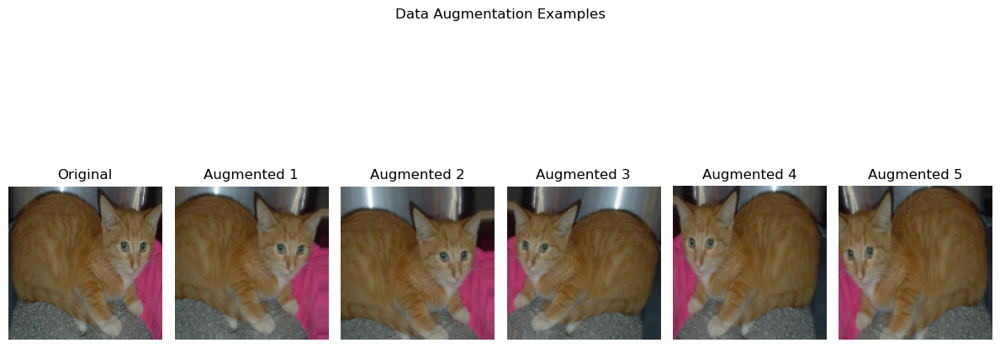

In [11]:
visualize_augmentation()

# 5. Modeling


## 5.1 First CNN Model - Simple Architecture


In [12]:

# 5.1. First CNN Model - Simple Architecture
def create_cnn_model1():
    model = Sequential([ # Creates a Sequential model (layers stacked in sequence).
        # First convolutional block
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        # First convolutional layer with 32 filters of size 3×3
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        Dropout(0.2),
        
        # Second convolutional block
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        Dropout(0.3),
        
        # Third convolutional block
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        Dropout(0.4),
        
        # Fully connected layers
        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(len(CATEGORIES), activation='softmax')
    ])
    
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    model.summary()
    return model


## 5.2 Second CNN Model - Deeper Architecture


In [13]:

# 5.2. Second CNN Model - Deeper Architecture
def create_cnn_model2():
    model = Sequential([
        # First block
        Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        
        # Second block
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        
        # Third block
        Conv2D(256, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(256, (3, 3), activation='relu', padding='same'),
        Conv2D(256, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        
        # Fourth block
        Conv2D(512, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(512, (3, 3), activation='relu', padding='same'),
        Conv2D(512, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(2, 2),
        Dropout(0.5),
        
        # Fully connected layers
        Flatten(),
        Dense(1024, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(len(CATEGORIES), activation='softmax')
    ])
    
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    model.summary()
    return model


## 5.3 Transfer Learning Model - VGG16


In [14]:

# 5.3. Transfer Learning - VGG16
def create_vgg16_model():
    # Load pre-trained VGG16 without top layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
    
    # Freeze the base model layers
    for layer in base_model.layers:
        layer.trainable = False
    
    # Add custom classification layers
    model = Sequential([
        base_model,
        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(len(CATEGORIES), activation='softmax')
    ])
    
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    model.summary()
    return model


## 5.4 Transfer Learning Model - MobileNetV2


In [15]:

# 5.4. Transfer Learning - MobileNetV2
def create_mobilenet_model():
    # Load pre-trained MobileNetV2 without top layers
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
    
    # Freeze the base model layers
    for layer in base_model.layers:
        layer.trainable = False
    
    # Add custom classification layers
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(len(CATEGORIES), activation='softmax')
    ])
    
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    model.summary()
    return model


## 5.5 Create Model Instances


In [16]:

# Create all models
cnn_model1 = create_cnn_model1()
cnn_model2 = create_cnn_model2()
vgg16_model = create_vgg16_model()
mobilenet_model = create_mobilenet_model()





Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 150, 150, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 75, 75, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 75, 75, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)      

# 6. Training


## 6.1 Define Callbacks


In [ ]:

# Setup callbacks
checkpoint_path = "model_checkpoints/" # Defines a folder path where model checkpoints will be saved.
os.makedirs(checkpoint_path, exist_ok=True) # Creates the checkpoint directory if it doesn't exist.

callbacks = [
    EarlyStopping( # Creates an early stopping callback to prevent overfitting.
        monitor='val_loss', # Monitors validation loss to decide when to stop.
        patience=2, # Waits for 10 epochs with no improvement before stopping.
        restore_best_weights=True, # Restores model to the weights from the epoch with the best value of monitored metric.
        verbose=1 # Shows messages when early stopping is triggered.
    ),
    ModelCheckpoint( # Creates a callback to save model checkpoints during training.
        filepath=checkpoint_path + 'model_{epoch:02d}_{val_accuracy:.4f}.h5',
        #Defines the filename pattern for saved models
        #Includes epoch number and validation accuracy in the filename

        monitor='val_accuracy', # Saves models based on validation accuracy.
        save_best_only=True, #  Only saves when the model improves.
        verbose=1
    )
]


## 6.2 Define Training and Plotting Function


In [18]:

# Function to train and plot training history
def train_and_plot_history(model, model_name, epochs=2):
    print(f"\nTraining {model_name}...") # Prints which model is being trained.
    
    history = model.fit( # Trains the model and returns a history object with training metrics.
        train_datagen.flow(X_train, y_train),
        #Uses the data generator to create augmented training data
        #Creates new, slightly modified versions of training images on-the-fly
        
        steps_per_epoch=len(X_train) // 32, # Sets how many batches to use per epoch.
        epochs=epochs, # Number of complete passes through the training data.
        validation_data=(X_val, y_val), # Data used to evaluate the model after each epoch.
        callbacks=callbacks, # Uses the callbacks defined earlier.
        verbose=1
    )
    
    # Save the model
    model.save(f"{model_name}.h5")
    
    # Plot training history
    plt.figure(figsize=(12, 5)) # Creates a figure with specified size.
    
    # Plot accuracy
    plt.subplot(1, 2, 1) # Creates a subplot in a 1×2 grid, first position.
    plt.plot(history.history['accuracy'], label='Train Accuracy') # Plots training accuracy.
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    
    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(f"{model_name}_history.png")
    plt.show()
    
    return history, model


## 6.3 Train All Models

### Train CNN_Model1


Training CNN_Model1...
Epoch 1/2


150/150 [==============================] - ETA: 0s - loss: 0.8887 - accuracy: 0.7017
Epoch 1: val_accuracy improved from -inf to 0.15845, saving model to model_checkpoints\model_01_0.1585.h5


c:\anaconda3\envs\nural-network\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


150/150 [==============================] - 94s 602ms/step - loss: 0.8887 - accuracy: 0.7017 - val_loss: 4.4572 - val_accuracy: 0.1585
Epoch 2/2
150/150 [==============================] - ETA: 0s - loss: 0.4917 - accuracy: 0.8291
Epoch 2: val_accuracy improved from 0.15845 to 0.34203, saving model to model_checkpoints\model_02_0.3420.h5
150/150 [==============================] - 92s 613ms/step - loss: 0.4917 - accuracy: 0.8291 - val_loss: 2.4420 - val_accuracy: 0.3420


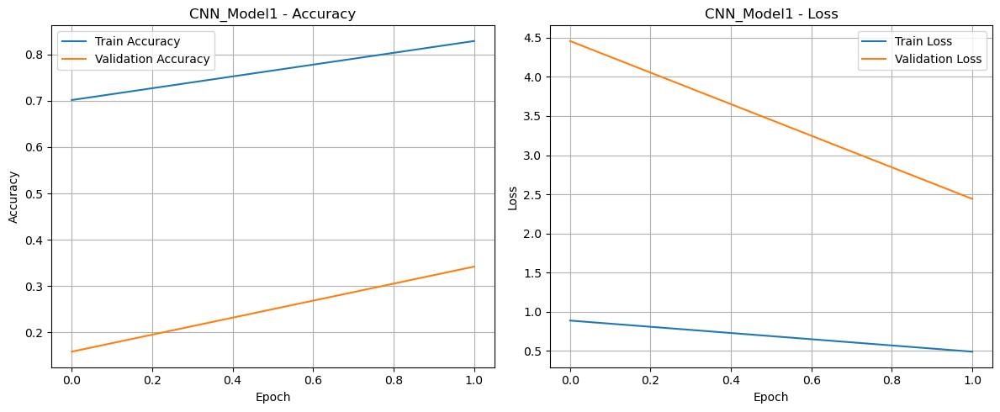

In [19]:

# Train all models
history1, cnn_model1 = train_and_plot_history(cnn_model1, "CNN_Model1")

### Train CNN_Model2


Training CNN_Model2...
Epoch 1/2
150/150 [==============================] - ETA: 0s - loss: 1.7454 - accuracy: 0.4526
Epoch 1: val_accuracy did not improve from 0.34203
150/150 [==============================] - 471s 3s/step - loss: 1.7454 - accuracy: 0.4526 - val_loss: 3.2085 - val_accuracy: 0.2193
Epoch 2/2
150/150 [==============================] - ETA: 0s - loss: 1.0398 - accuracy: 0.6508
Epoch 2: val_accuracy did not improve from 0.34203
150/150 [==============================] - 562s 4s/step - loss: 1.0398 - accuracy: 0.6508 - val_loss: 3.0444 - val_accuracy: 0.3121


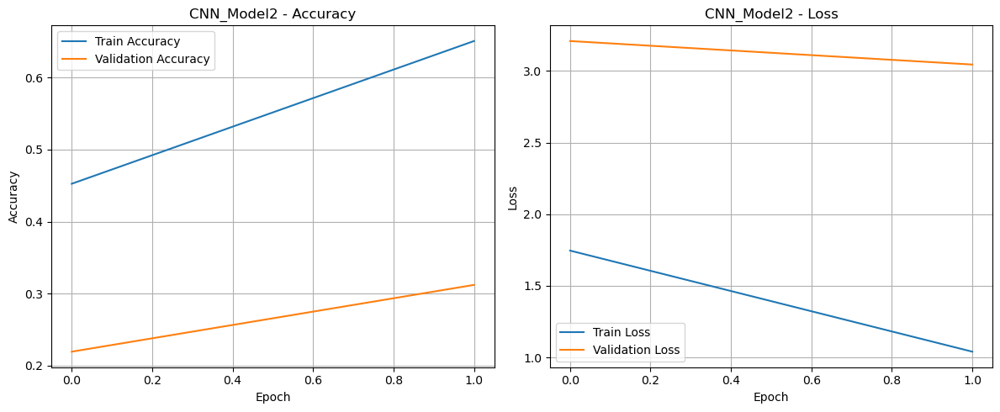

In [20]:
history2, cnn_model2 = train_and_plot_history(cnn_model2, "CNN_Model2")

### Train VGG16_Model


Training VGG16_Model...
Epoch 1/2
150/150 [==============================] - ETA: 0s - loss: 0.2820 - accuracy: 0.9054
Epoch 1: val_accuracy improved from 0.34203 to 0.94010, saving model to model_checkpoints\model_01_0.9401.h5
150/150 [==============================] - 182s 1s/step - loss: 0.2820 - accuracy: 0.9054 - val_loss: 0.1531 - val_accuracy: 0.9401
Epoch 2/2
150/150 [==============================] - ETA: 0s - loss: 0.1469 - accuracy: 0.9468
Epoch 2: val_accuracy improved from 0.94010 to 0.96522, saving model to model_checkpoints\model_02_0.9652.h5
150/150 [==============================] - 213s 1s/step - loss: 0.1469 - accuracy: 0.9468 - val_loss: 0.0963 - val_accuracy: 0.9652


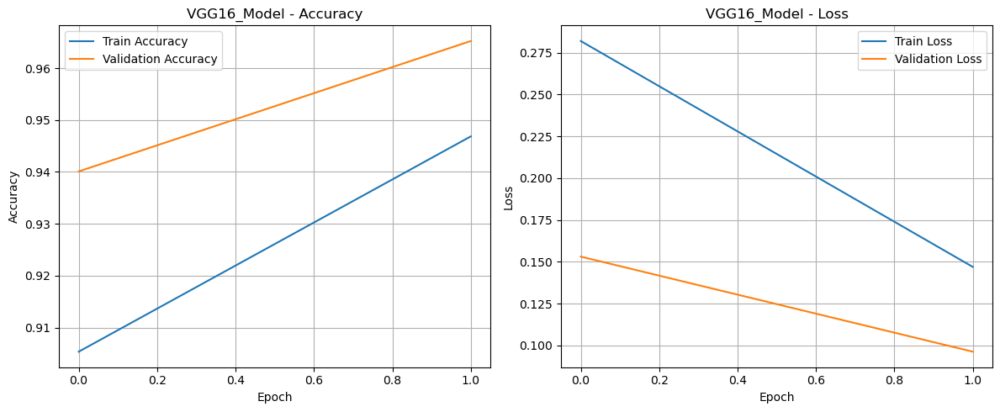

In [21]:
history3, vgg16_model = train_and_plot_history(vgg16_model, "VGG16_Model")

### Train MobileNet_Model


Training MobileNet_Model...
Epoch 1/2
150/150 [==============================] - ETA: 0s - loss: 0.1349 - accuracy: 0.9596
Epoch 1: val_accuracy improved from 0.96522 to 0.98841, saving model to model_checkpoints\model_01_0.9884.h5
150/150 [==============================] - 25s 152ms/step - loss: 0.1349 - accuracy: 0.9596 - val_loss: 0.0391 - val_accuracy: 0.9884
Epoch 2/2
150/150 [==============================] - ETA: 0s - loss: 0.0460 - accuracy: 0.9858
Epoch 2: val_accuracy improved from 0.98841 to 0.98937, saving model to model_checkpoints\model_02_0.9894.h5
150/150 [==============================] - 22s 148ms/step - loss: 0.0460 - accuracy: 0.9858 - val_loss: 0.0259 - val_accuracy: 0.9894


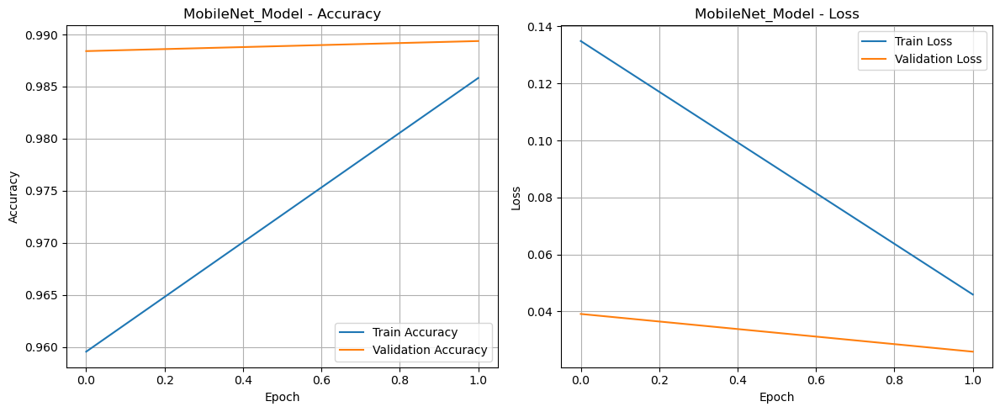

In [22]:
history4, mobilenet_model = train_and_plot_history(mobilenet_model, "MobileNet_Model")

# 7. Evaluation


## 7.1 Define Evaluation Function


In [23]:

# Function to evaluate model performance
def evaluate_model(model, model_name):
    print(f"\nEvaluating {model_name}...")
    
    # Evaluate on test set
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=1)
    print(f"{model_name} - Test Accuracy: {test_acc*100:.2f}%")
    
    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    # Classification report
    print(f"\n{model_name} - Classification Report:")
    report = classification_report(y_test, y_pred_classes, target_names=CATEGORIES)
    print(report)
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred_classes)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CATEGORIES, yticklabels=CATEGORIES)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f"{model_name}_confusion_matrix.png")
    plt.show()
    
    # Visualize some predictions
    plt.figure(figsize=(15, 10))
    for i in range(15):
        plt.subplot(3, 5, i+1)
        plt.imshow(X_test[i])
        true_label = CATEGORIES[y_test[i]]
        pred_label = CATEGORIES[y_pred_classes[i]]
        title_color = 'green' if true_label == pred_label else 'red'
        plt.title(f"True: {true_label}\nPred: {pred_label}", color=title_color)
        plt.axis('off')
    
    plt.suptitle(f'{model_name} - Sample Predictions')
    plt.tight_layout()
    plt.savefig(f"{model_name}_sample_predictions.png")
    plt.show()
    
    return test_acc, report, cm


## 7.2 Evaluate All Models



Evaluating CNN_Model1...
33/33 [==============================] - 4s 118ms/step - loss: 2.3713 - accuracy: 0.3353
CNN_Model1 - Test Accuracy: 33.53%
33/33 [==============================] - 4s 115ms/step

CNN_Model1 - Classification Report:
              precision    recall  f1-score   support

    airplane       0.69      0.56      0.62       115
         car       0.00      0.00      0.00       134
         cat       0.25      0.81      0.38       135
         dog       0.47      0.15      0.23       110
      flower       1.00      0.02      0.05       127
       fruit       0.00      0.00      0.00       157
   motorbike       0.00      0.00      0.00       103
      person       0.34      1.00      0.50       154

    accuracy                           0.34      1035
   macro avg       0.34      0.32      0.22      1035
weighted avg       0.33      0.34      0.22      1035



c:\anaconda3\envs\nural-network\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\anaconda3\envs\nural-network\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\anaconda3\envs\nural-network\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


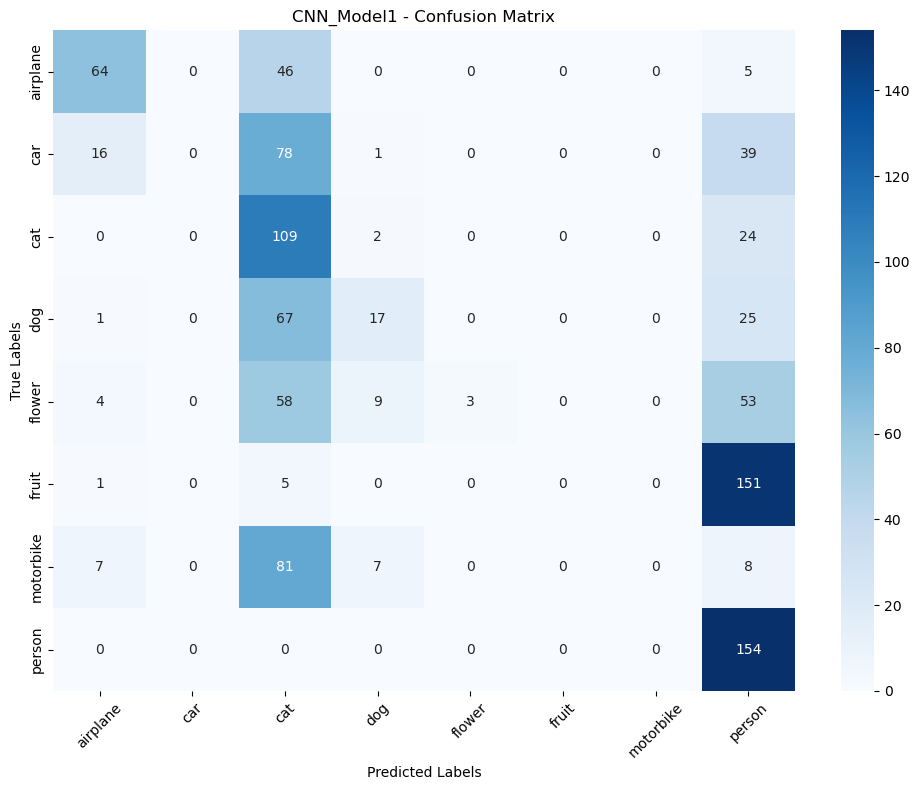

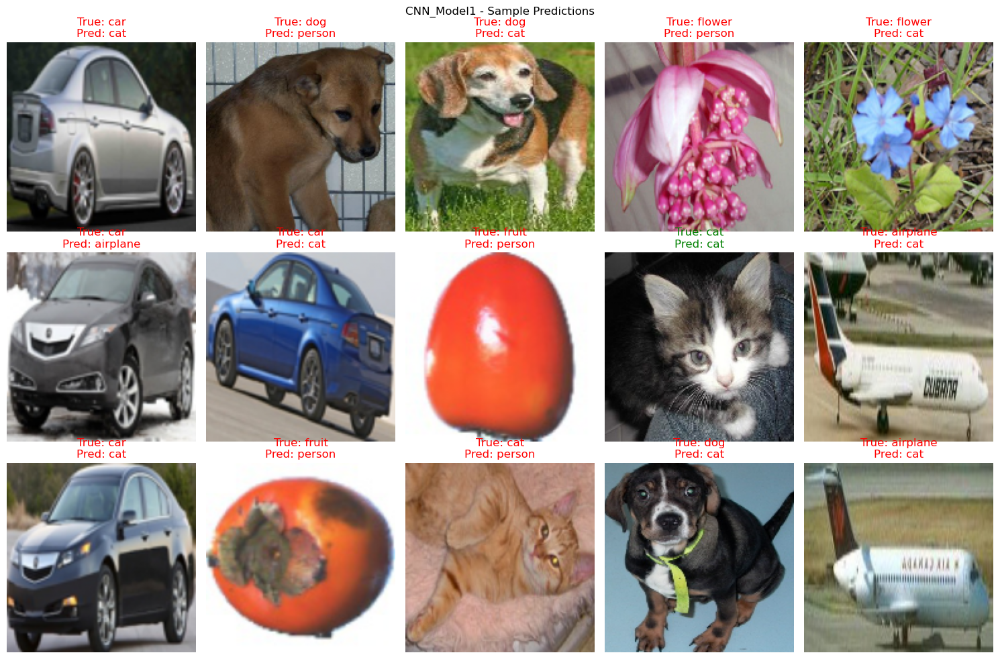


Evaluating CNN_Model2...
33/33 [==============================] - 23s 685ms/step - loss: 3.0030 - accuracy: 0.3130
CNN_Model2 - Test Accuracy: 31.30%
33/33 [==============================] - 23s 704ms/step

CNN_Model2 - Classification Report:
              precision    recall  f1-score   support

    airplane       0.58      0.43      0.49       115
         car       1.00      0.01      0.01       134
         cat       0.23      0.82      0.36       135
         dog       0.21      0.11      0.14       110
      flower       1.00      0.11      0.20       127
       fruit       0.00      0.00      0.00       157
   motorbike       0.00      0.00      0.00       103
      person       0.34      0.89      0.49       154

    accuracy                           0.31      1035
   macro avg       0.42      0.30      0.21      1035
weighted avg       0.42      0.31      0.22      1035



c:\anaconda3\envs\nural-network\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\anaconda3\envs\nural-network\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\anaconda3\envs\nural-network\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


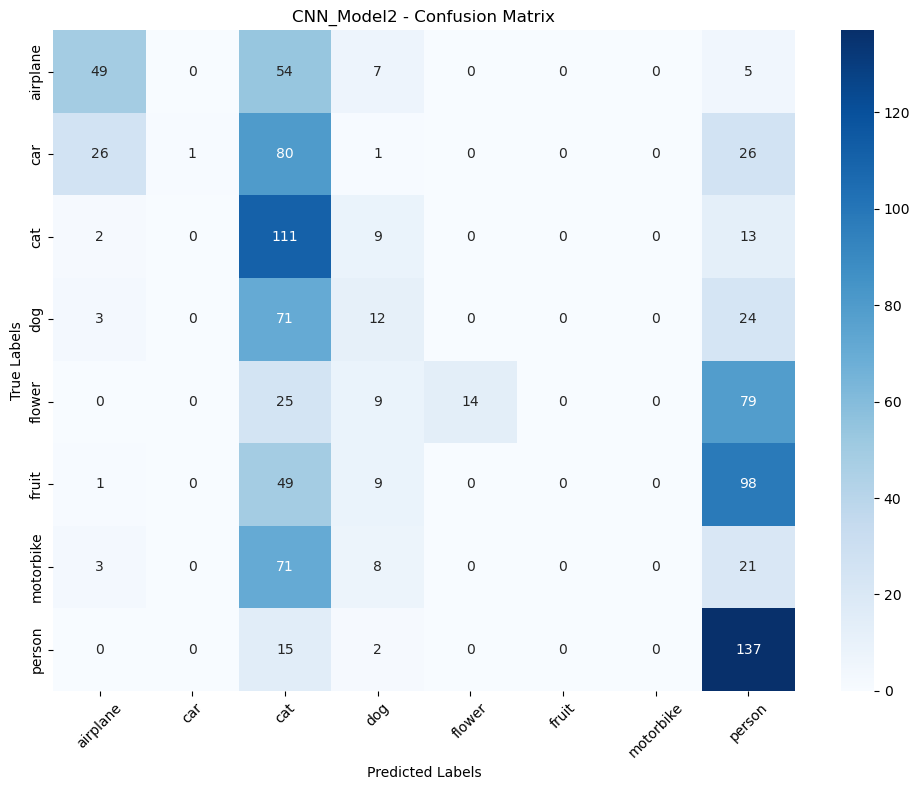

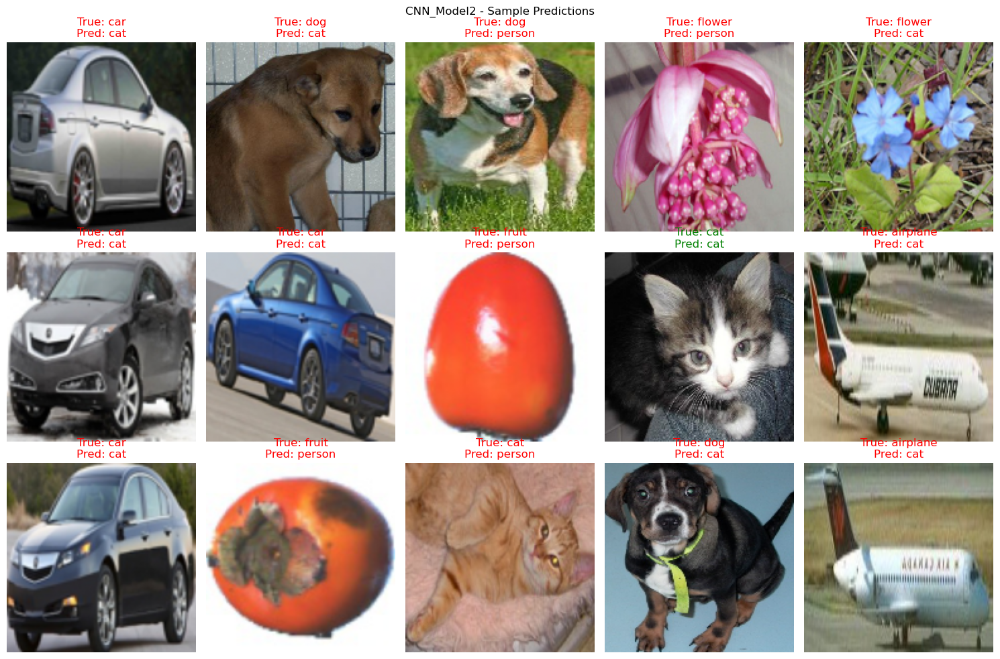


Evaluating VGG16_Model...
33/33 [==============================] - 38s 1s/step - loss: 0.0737 - accuracy: 0.9739
VGG16_Model - Test Accuracy: 97.39%
33/33 [==============================] - 44s 1s/step

VGG16_Model - Classification Report:
              precision    recall  f1-score   support

    airplane       0.98      1.00      0.99       115
         car       1.00      0.99      0.99       134
         cat       0.95      0.93      0.94       135
         dog       0.88      0.92      0.90       110
      flower       0.98      0.96      0.97       127
       fruit       0.99      1.00      1.00       157
   motorbike       0.99      1.00      1.00       103
      person       1.00      0.99      1.00       154

    accuracy                           0.97      1035
   macro avg       0.97      0.97      0.97      1035
weighted avg       0.97      0.97      0.97      1035



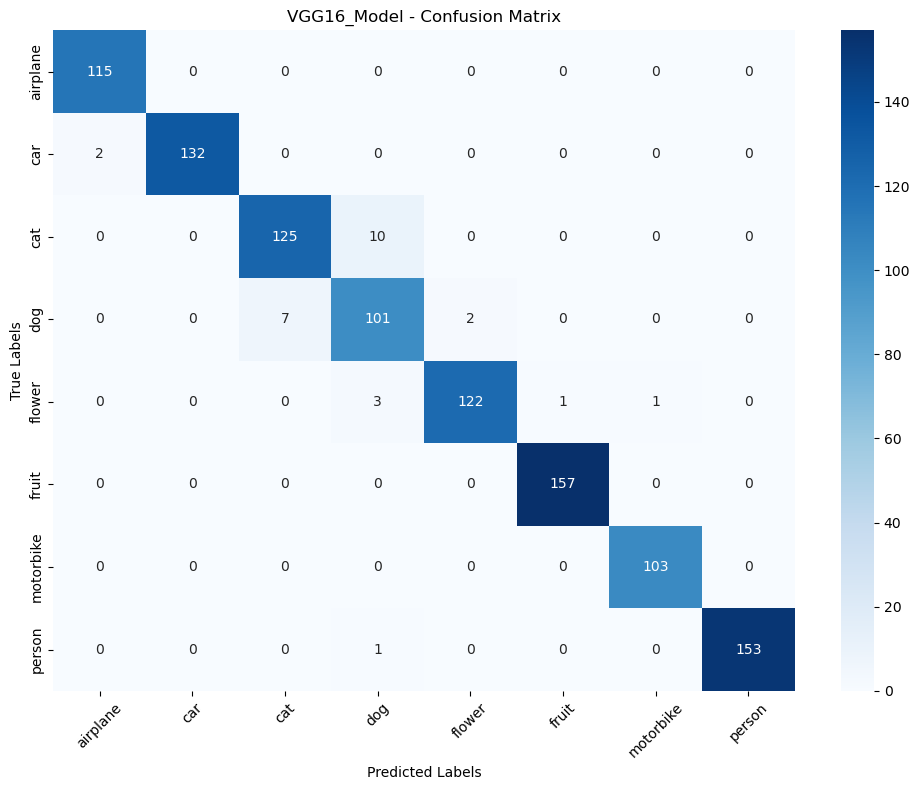

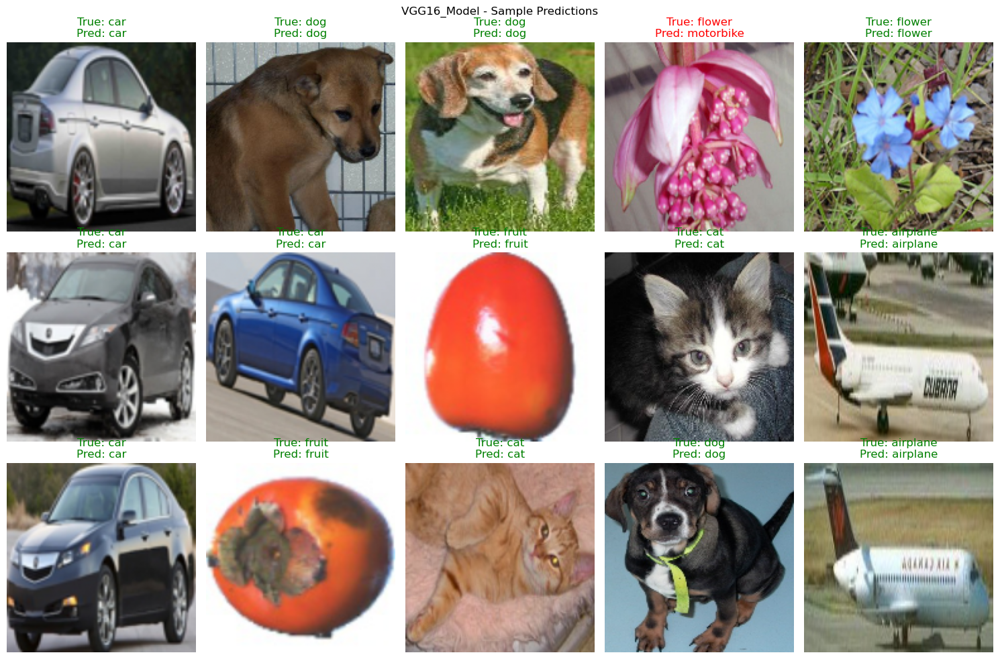


Evaluating MobileNet_Model...
33/33 [==============================] - 3s 78ms/step - loss: 0.0222 - accuracy: 0.9932
MobileNet_Model - Test Accuracy: 99.32%
33/33 [==============================] - 4s 119ms/step

MobileNet_Model - Classification Report:
              precision    recall  f1-score   support

    airplane       1.00      1.00      1.00       115
         car       1.00      1.00      1.00       134
         cat       0.96      0.99      0.97       135
         dog       0.99      0.95      0.97       110
      flower       1.00      1.00      1.00       127
       fruit       1.00      1.00      1.00       157
   motorbike       1.00      1.00      1.00       103
      person       1.00      1.00      1.00       154

    accuracy                           0.99      1035
   macro avg       0.99      0.99      0.99      1035
weighted avg       0.99      0.99      0.99      1035



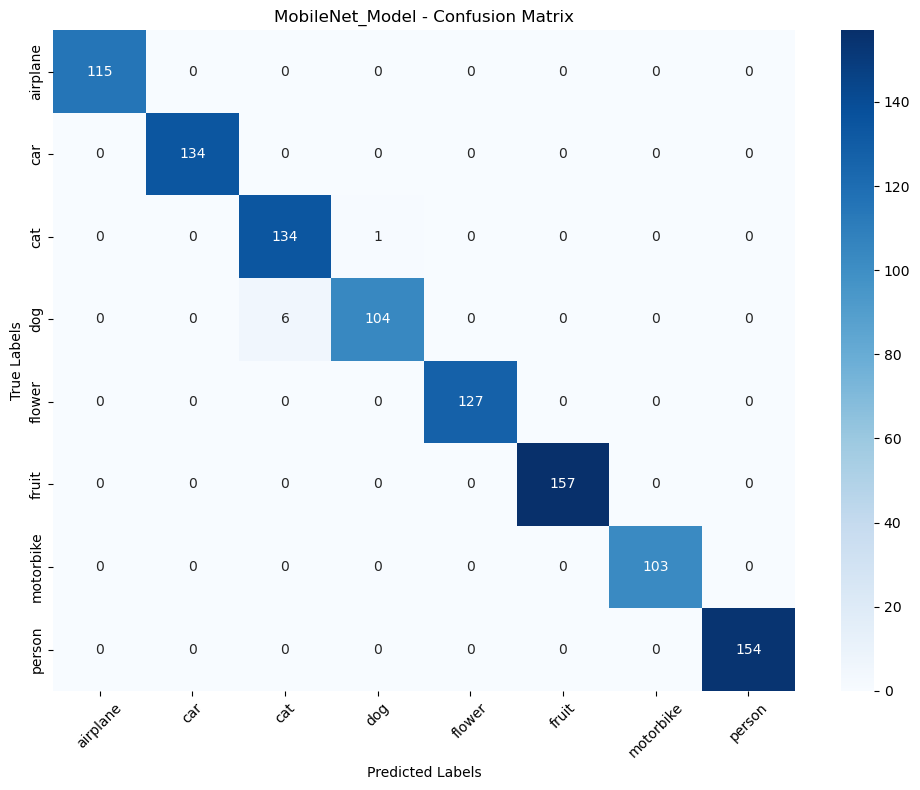

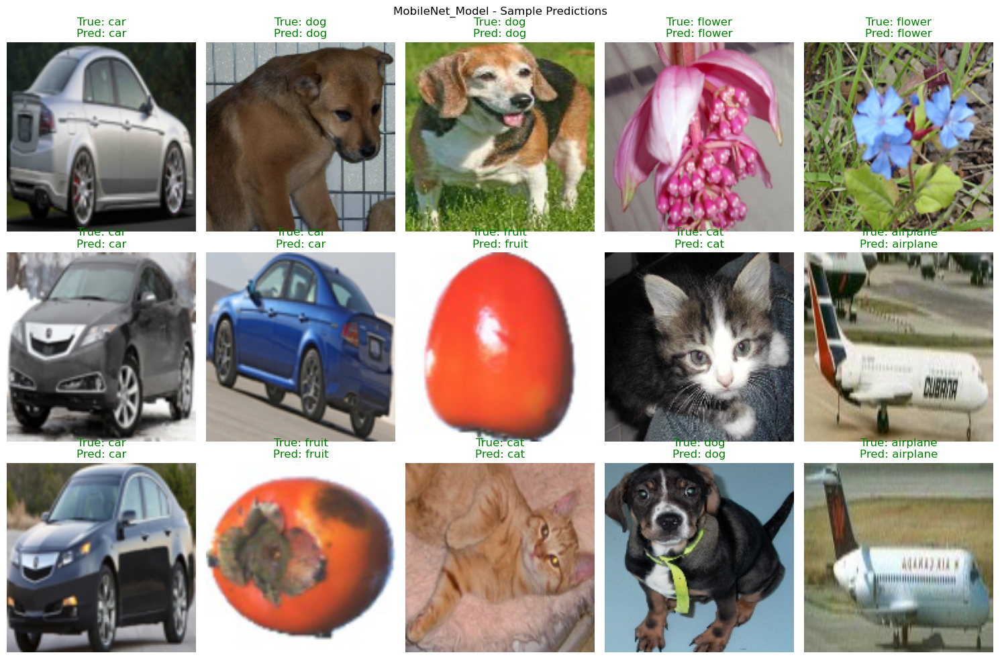

In [24]:

acc1, report1, cm1 = evaluate_model(cnn_model1, "CNN_Model1")
acc2, report2, cm2 = evaluate_model(cnn_model2, "CNN_Model2")
acc3, report3, cm3 = evaluate_model(vgg16_model, "VGG16_Model")
acc4, report4, cm4 = evaluate_model(mobilenet_model, "MobileNet_Model")


## 7.3 Compare Model Accuracies


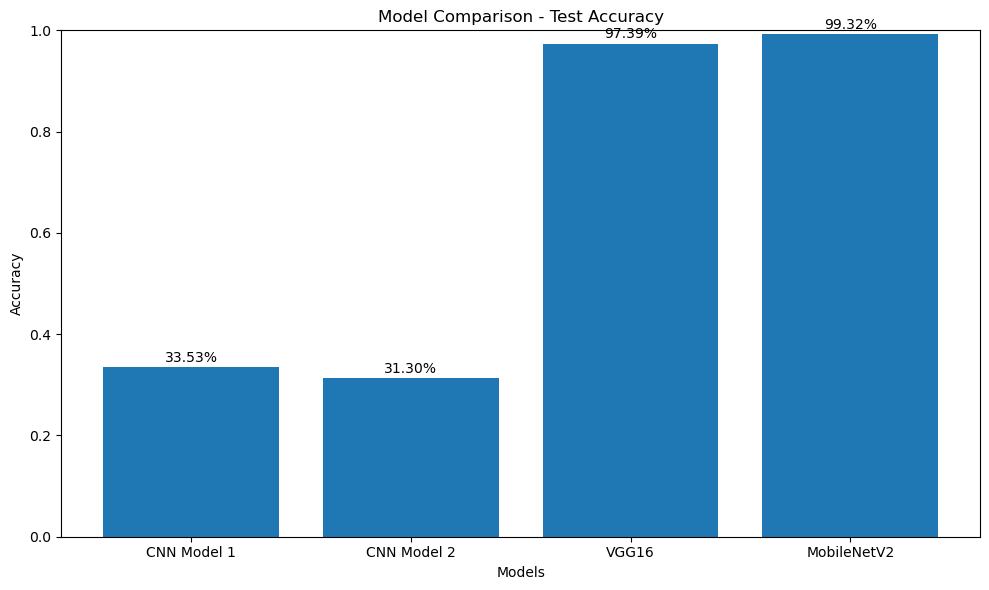

In [25]:

model_names = ["CNN Model 1", "CNN Model 2", "VGG16", "MobileNetV2"]
accuracies = [acc1, acc2, acc3, acc4]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies)
plt.title('Model Comparison - Test Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
for i, acc in enumerate(accuracies):
    plt.text(i, acc+0.01, f'{acc*100:.2f}%', ha='center')
plt.tight_layout()
plt.savefig("model_comparison.png")
plt.show()


## 7.4 Select the Best Model


In [26]:

best_model_index = np.argmax(accuracies)
best_model_name = model_names[best_model_index]
print(f"\nBest performing model: {best_model_name} with accuracy {accuracies[best_model_index]*100:.2f}%")



Best performing model: MobileNetV2 with accuracy 99.32%


# 8. INFERENCE PIPELINE


In [1]:
# ======================================================
# 8. INFERENCE PIPELINE
# ======================================================
# Function to create an inference pipeline
def create_inference_pipeline(model, model_name):
    print(f"\nCreating inference pipeline for {model_name}...")
    
    def predict_image(image_path):
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resized = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img_normalized = img_resized / 255.0
        img_input = np.expand_dims(img_normalized, axis=0)
        
        # Make prediction
        prediction = model.predict(img_input)
        predicted_class_index = np.argmax(prediction[0])
        predicted_class = CATEGORIES[predicted_class_index]
        confidence = prediction[0][predicted_class_index] * 100
        
        # Display result
        plt.figure(figsize=(6, 6))
        plt.imshow(img_resized)
        plt.title(f"Prediction: {predicted_class}\nConfidence: {confidence:.2f}%")
        plt.axis('off')
        plt.show()
        
        return predicted_class, confidence
    
    # Test the pipeline with a sample image
    sample_img_path = os.path.join(DATADIR, CATEGORIES[0], os.listdir(os.path.join(DATADIR, CATEGORIES[0]))[0])
    print(f"Testing inference pipeline with sample image: {sample_img_path}")
    predicted_class, confidence = predict_image(sample_img_path)
    print(f"Prediction: {predicted_class}, Confidence: {confidence:.2f}%")
    
    return predict_image

# Get the best model based on accuracy
if best_model_index == 0:
    best_model = cnn_model1
elif best_model_index == 1:
    best_model = cnn_model2
elif best_model_index == 2:
    best_model = vgg16_model
else:
    best_model = mobilenet_model

# Create inference pipeline for the best model
inference_pipeline = create_inference_pipeline(best_model, best_model_name)

print("\nProject Complete! The inference pipeline is ready for use.")

NameError: name 'best_model_index' is not defined